Importing all the neccessary libraries

In [96]:
import pandas as pd
import numpy as np  
import seaborn as sns
import math
%matplotlib inline
from matplotlib import pyplot as plt
from matplotlib import style
from sklearn import linear_model
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import Perceptron
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBClassifier
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler, OneHotEncoder
from sklearn.metrics import log_loss
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, StratifiedKFold
from sklearn.cluster import KMeans
import folium
from folium import plugins
from folium.plugins import MarkerCluster
from datetime import datetime

Loading our train and test dataset

In [97]:
train = pd.read_csv("C:/Users/13127/Downloads/train.csv.zip")
test = pd.read_csv("C:/Users/13127/Downloads/test.csv.zip")

In [98]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541


In [99]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878049 entries, 0 to 878048
Data columns (total 9 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   Dates       878049 non-null  object 
 1   Category    878049 non-null  object 
 2   Descript    878049 non-null  object 
 3   DayOfWeek   878049 non-null  object 
 4   PdDistrict  878049 non-null  object 
 5   Resolution  878049 non-null  object 
 6   Address     878049 non-null  object 
 7   X           878049 non-null  float64
 8   Y           878049 non-null  float64
dtypes: float64(2), object(7)
memory usage: 60.3+ MB


In [100]:
plt.rcParams['figure.figsize'] = [10, 6]
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_columns', 50)
sns.set_style('whitegrid')

In [101]:
crime_counts = train['Category'].value_counts()
crime_names = crime_counts.index.tolist()

In [102]:
train['Category'].isnull().values.any()

False

In [103]:
train['Category'].value_counts()

Category
LARCENY/THEFT                  174900
OTHER OFFENSES                 126182
NON-CRIMINAL                    92304
ASSAULT                         76876
DRUG/NARCOTIC                   53971
VEHICLE THEFT                   53781
VANDALISM                       44725
WARRANTS                        42214
BURGLARY                        36755
SUSPICIOUS OCC                  31414
MISSING PERSON                  25989
ROBBERY                         23000
FRAUD                           16679
FORGERY/COUNTERFEITING          10609
SECONDARY CODES                  9985
WEAPON LAWS                      8555
PROSTITUTION                     7484
TRESPASS                         7326
STOLEN PROPERTY                  4540
SEX OFFENSES FORCIBLE            4388
DISORDERLY CONDUCT               4320
DRUNKENNESS                      4280
RECOVERED VEHICLE                3138
KIDNAPPING                       2341
DRIVING UNDER THE INFLUENCE      2268
RUNAWAY                          1946
LIQ

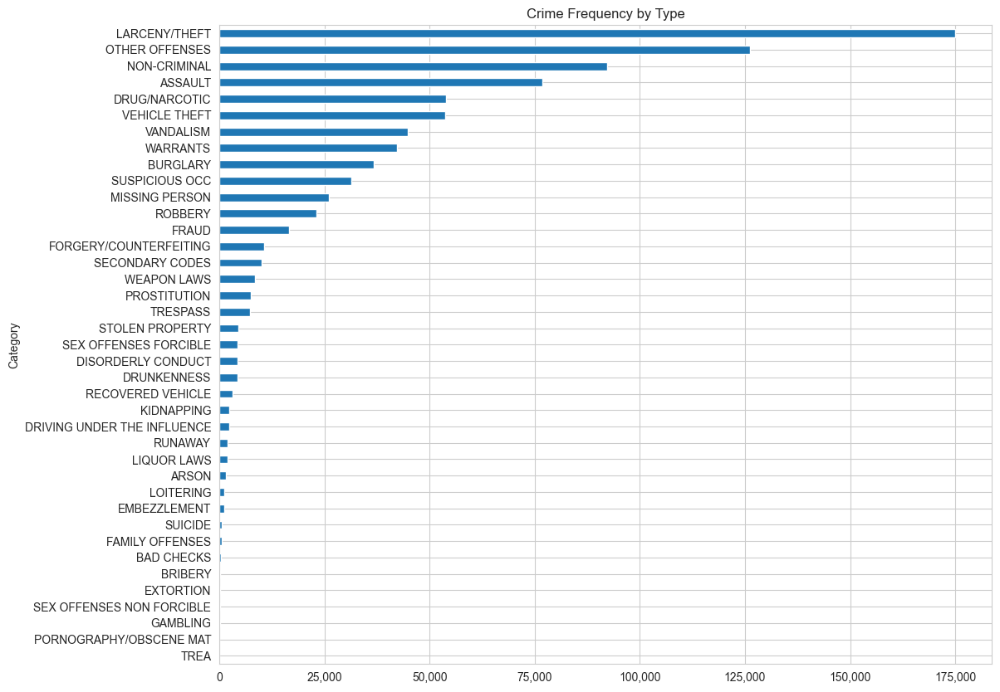

In [104]:
crime_type_df = train['Category'].value_counts(ascending=True)
plt.figure(figsize=(12, 10))
plt.title("Crime Frequency by Type")
plt.xlabel("Number of Occurrences")
plt.ylabel("Crime Type")
ax = crime_type_df.plot(kind='barh')
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

Convert Dates to DateTime and Extract Hour, Month, and Year

In [105]:
train["Dates"] = pd.to_datetime(train["Dates"], format="%Y-%m-%d %H:%M:%S")
train["Hour"] = train["Dates"].dt.hour
train["Month"] = train["Dates"].dt.month
train["Year"] = train["Dates"].dt.year

In [106]:
def plot_temporal_feature(data_frame, time_feature, categories, xaxis_formatter=None, xtick_inc=None):
    # Set figure size
    fig, axes = plt.subplots(nrows=10, ncols=4, figsize=(20, 40))

    for i, ax in enumerate(axes.flat):
        if i < len(categories):
            crime = categories[i]
            cur_crime_data = data_frame[data_frame['Category'] == crime]
            temporal_data = cur_crime_data[time_feature].value_counts().sort_index()
            sns.lineplot(data=temporal_data, ax=ax)
            ax.tick_params(axis='both', which='major', labelsize=13)
            ax.set_ylabel("Frequency of Crime", fontsize=15)
            ax.set_xlabel(time_feature.capitalize(), fontsize=15)
            ax.set_title("%s (%s)" % (crime, 'per ' + time_feature.capitalize()), fontsize=20)
            if xtick_inc:
                ax.set_xticks(np.arange(data_frame[time_feature].min(), data_frame[time_feature].max() + 1, xtick_inc))
            if xaxis_formatter:
                ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, loc: xaxis_formatter(x)))

    # Adjust layout
    plt.tight_layout()

    # Save plot image to a specified directory
    directory_path = "C:/Users/13127/Downloads"  # Specify your directory path here
    fig.savefig(f"{directory_path}/{time_feature}_temporal_plot.png", bbox_inches='tight')

In [107]:
def time_converter(hour):
    parsed_hour = datetime.strptime(str(hour), "%H")
    return parsed_hour.strftime("%I:%M %p")

In [108]:
crime_per_time = train["Hour"].value_counts().sort_index()
crime_per_time

Hour
0     44865
1     26173
2     22296
3     14014
4      9863
5      8637
6     13133
7     22048
8     32900
9     35555
10    37806
11    38373
12    51934
13    43145
14    44424
15    48058
16    50137
17    53553
18    55104
19    49475
20    44694
21    43661
22    45741
23    42460
Name: count, dtype: int64

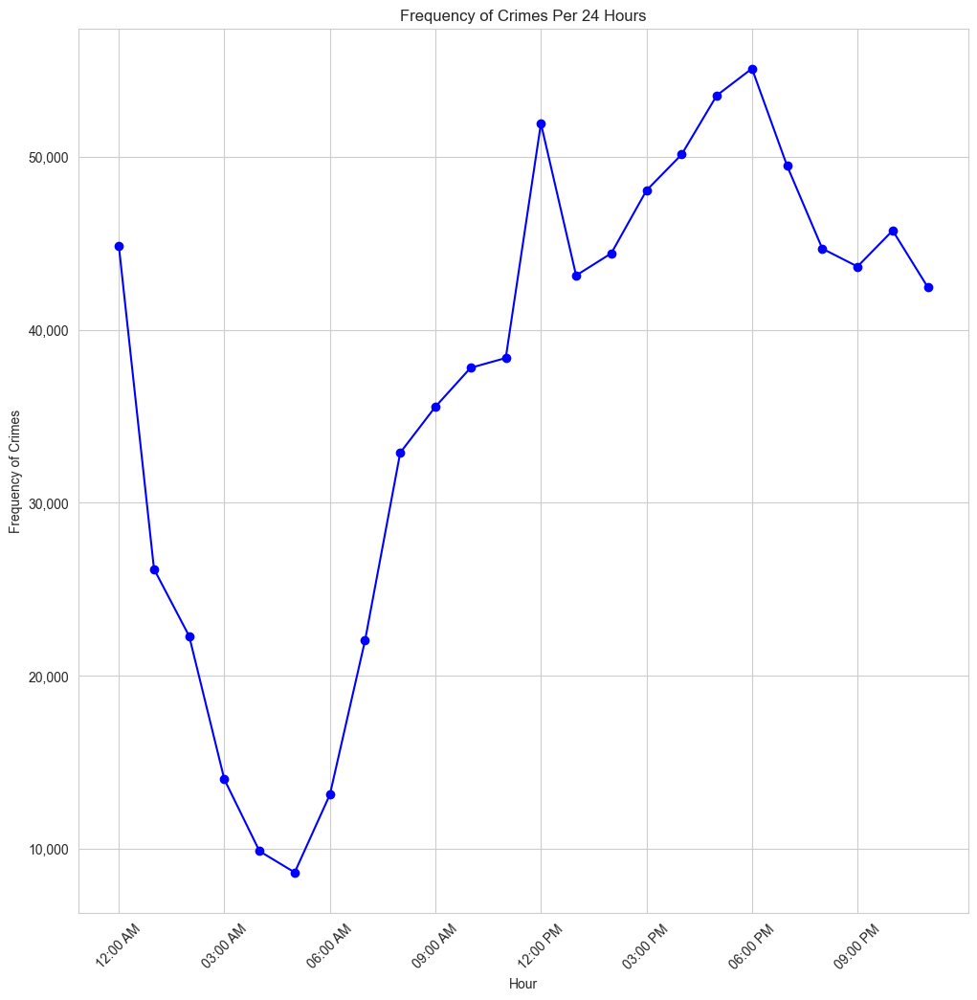

In [109]:
fig = plt.figure(figsize=(12, 12))

plt.title("Frequency of Crimes Per 24 Hours")
plt.xlabel("Time of Crime")
plt.ylabel("Frequency of Crimes")

ax = crime_per_time.plot(grid=True, marker='o', color='blue')

# Set x-ticks to every 3 hours
ax.set_xticks(crime_per_time.index[::3])

# Format x-axis ticks using the time_converter function
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: time_converter(x)))

# Rotate the x-axis labels for better readability
plt.xticks(rotation=45)

# Display fewer tick labels
plt.locator_params(axis='x', nbins=10)

# Format y-axis ticks to include thousands separator
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

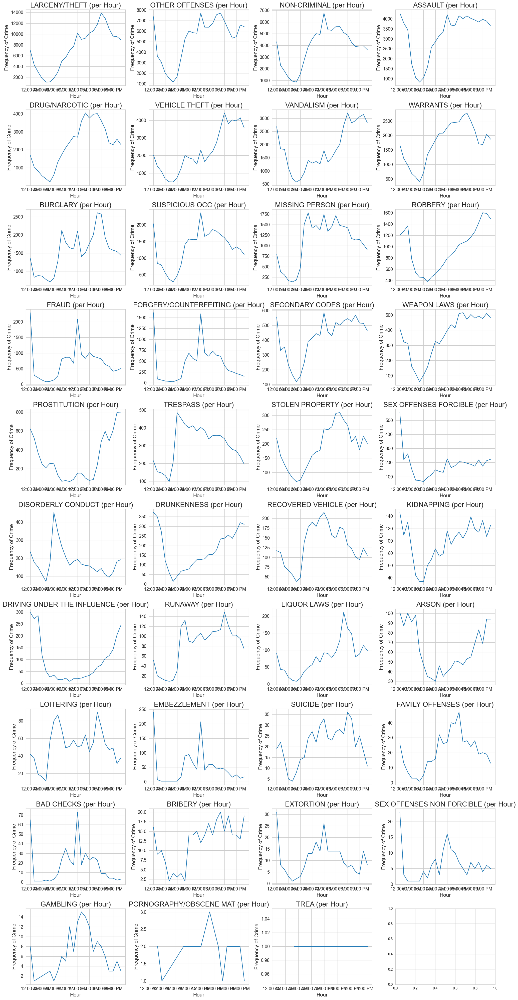

In [110]:
plot_temporal_feature(train, 'Hour', crime_names, time_converter, xtick_inc=3)

In [111]:
crime_per_month = train['Month'].value_counts().sort_index()
crime_per_month

Month
1     73536
2     70813
3     76320
4     78096
5     79644
6     70892
7     69971
8     68540
9     71982
10    80274
11    72975
12    65006
Name: count, dtype: int64

In [112]:
import calendar

def month_converter(num):
    return calendar.month_abbr[num]

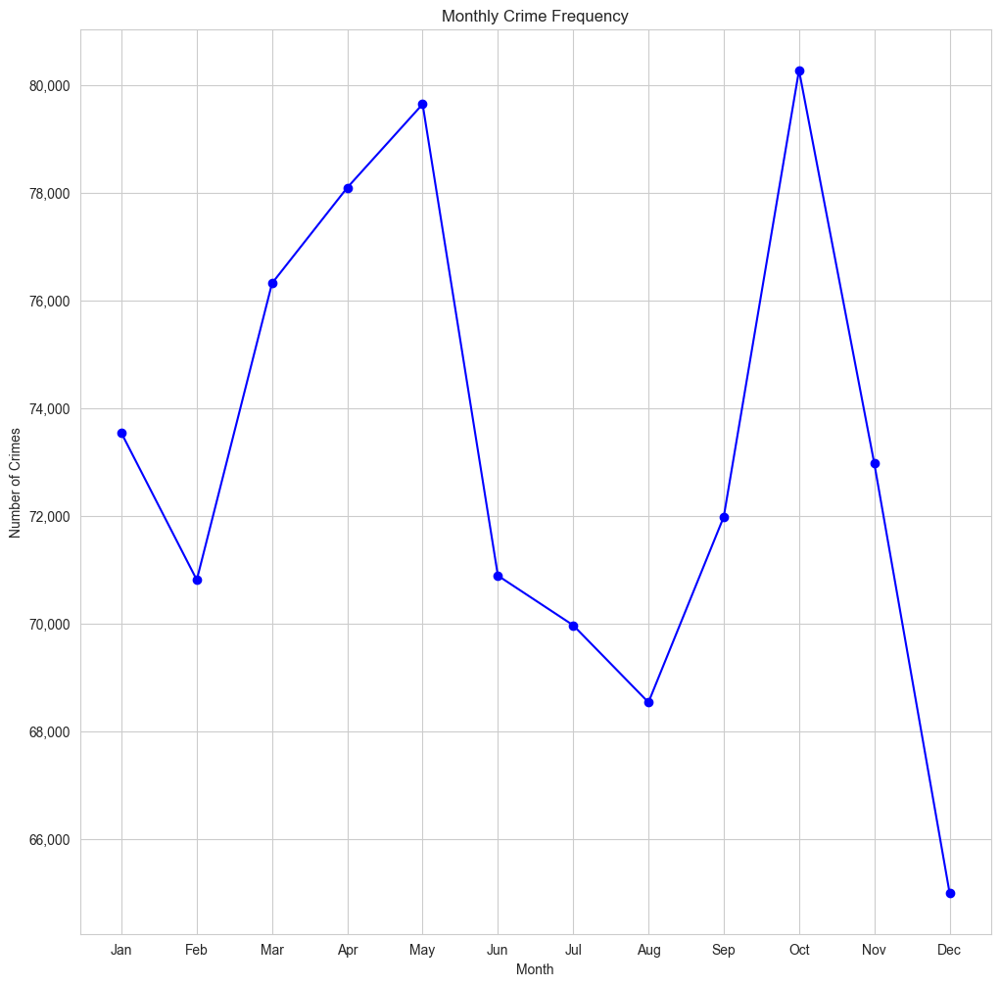

In [113]:
fig = plt.figure(figsize=(12, 12))

plt.title("Monthly Crime Frequency")
plt.xlabel("Month")
plt.ylabel("Number of Crimes")

ax = crime_per_month.plot(grid=True, marker='o', color='blue')

# Set x-ticks to each month
ax.set_xticks(crime_per_month.index)

# Format x-axis ticks using the month_converter function
ax.get_xaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: month_converter(x)))

# Format y-axis ticks to include thousands separator
ax.get_yaxis().set_major_formatter(plt.FuncFormatter(lambda x, loc: "{:,}".format(int(x))))

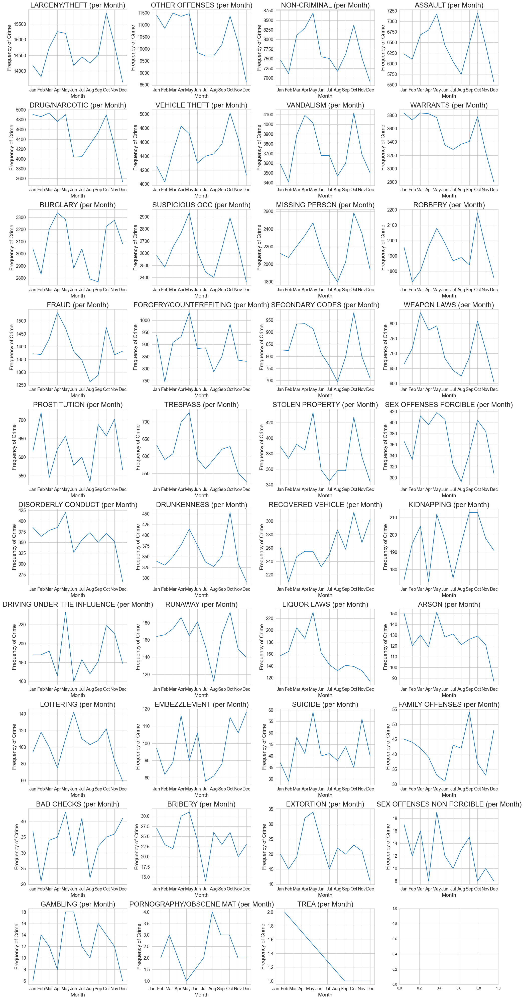

In [114]:
plot_temporal_feature(train, 'Month', crime_names, month_converter, xtick_inc=1)

In [115]:
# Categorize the days of the week in the 'DayOfWeek' column
train['DayOfWeek'] = pd.Categorical(train['DayOfWeek'],
                                    categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'],
                                    ordered=True)

# Count the occurrences of crimes per day of the week
crimes_by_day = train['DayOfWeek'].value_counts().sort_index()

# Get the days of the week as index values
days_of_week = crimes_by_day.index.values
print(days_of_week)

['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
Categories (7, object): ['Monday' < 'Tuesday' < 'Wednesday' < 'Thursday' < 'Friday' < 'Saturday' < 'Sunday']


[Text(0, 0, 'Monday'),
 Text(1, 0, 'Tuesday'),
 Text(2, 0, 'Wednesday'),
 Text(3, 0, 'Thursday'),
 Text(4, 0, 'Friday'),
 Text(5, 0, 'Saturday'),
 Text(6, 0, 'Sunday')]

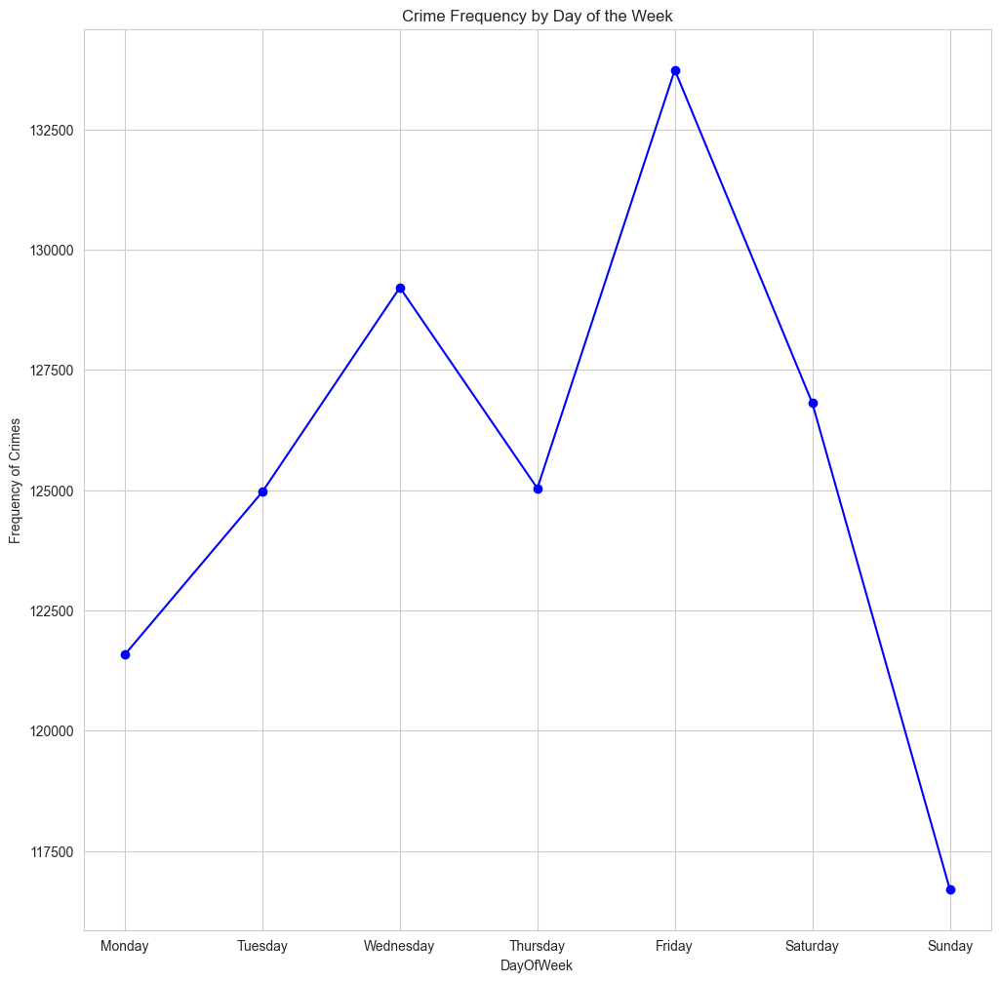

In [116]:
# Create a figure
fig = plt.figure(figsize=(12, 12))

# Set the title and labels for the plot
plt.title("Crime Frequency by Day of the Week")
plt.xlabel("Day of the Week")
plt.ylabel("Frequency of Crimes")

# Plot the crime frequency by day of the week
ax = crimes_by_day.plot(grid=True, marker='o', color='blue')

# Set custom x-axis ticks and labels
ax.set_xticks([0, 1, 2, 3, 4, 5, 6])
ax.set_xticklabels(days_of_week)

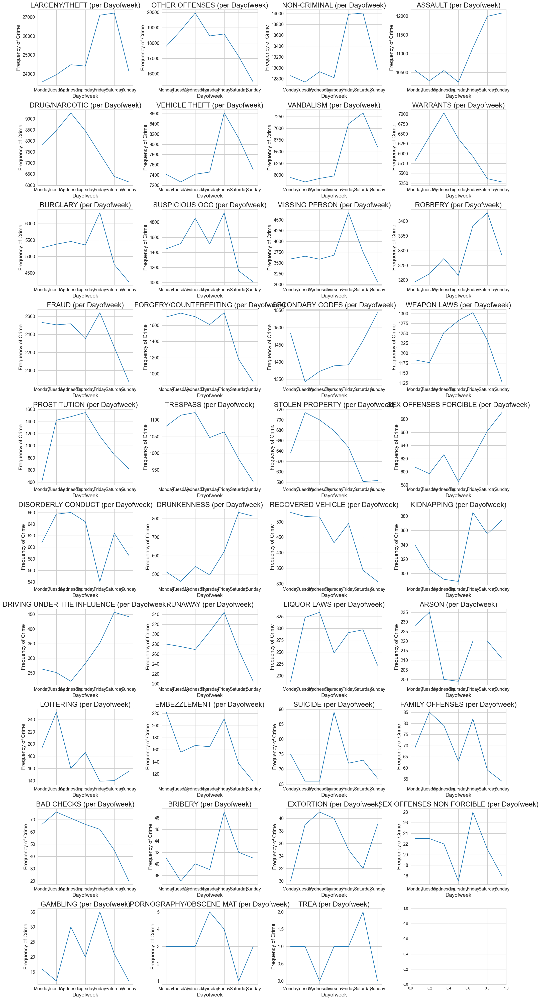

In [117]:
plot_temporal_feature(train, 'DayOfWeek', crime_names, None, None)

In [118]:
crime_per_year = train["Year"].value_counts().sort_index()
crime_per_year

Year
2003    73902
2004    73422
2005    70779
2006    69909
2007    68015
2008    70174
2009    69000
2010    66542
2011    66619
2012    71731
2013    75606
2014    74766
2015    27584
Name: count, dtype: int64

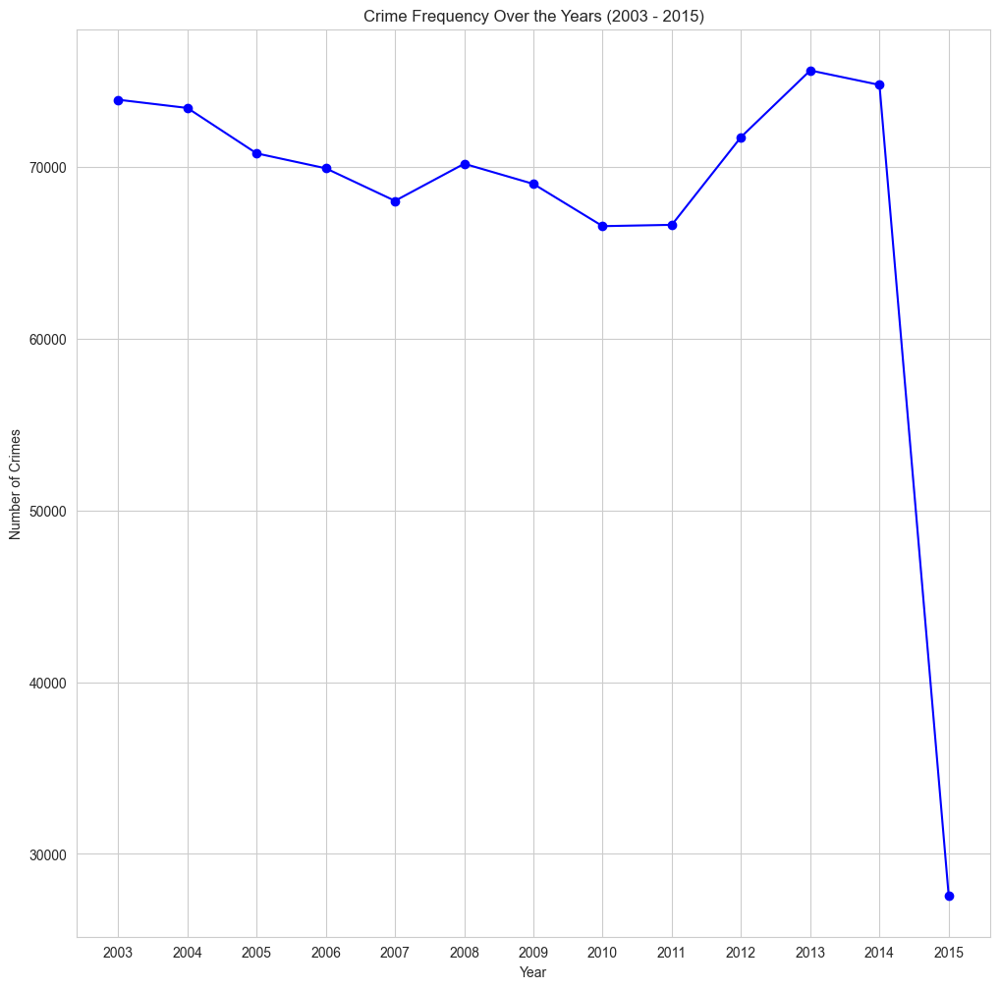

In [119]:
fig = plt.figure(figsize=(12, 12))
plt.title("Crime Frequency Over the Years (2003 - 2015)")
plt.xlabel("Year")
plt.ylabel("Number of Crimes")

ax = crime_per_year.plot(grid=True, marker='o', color='blue')
ax.set_xticks(crime_per_year.index)

plt.show()

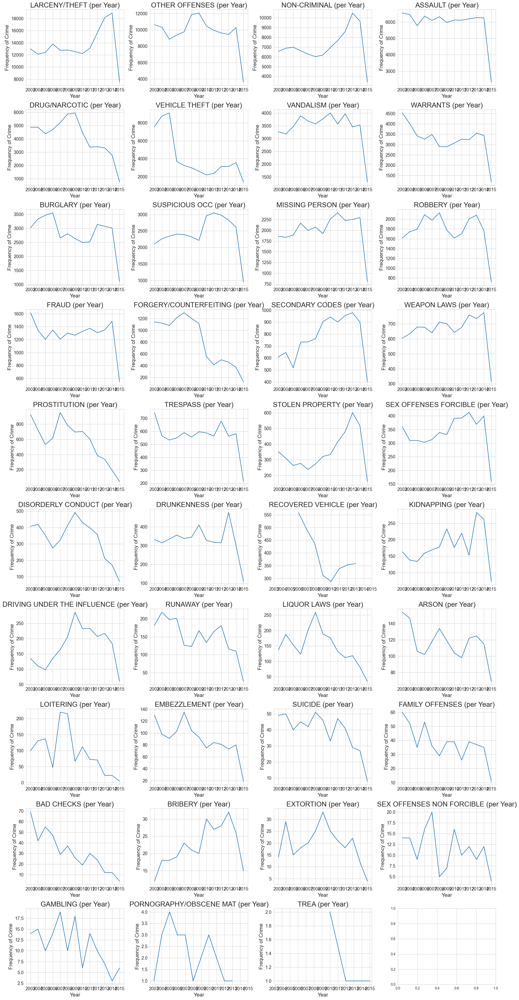

In [120]:
plot_temporal_feature(train, 'Year', crime_names, None, xtick_inc=1)

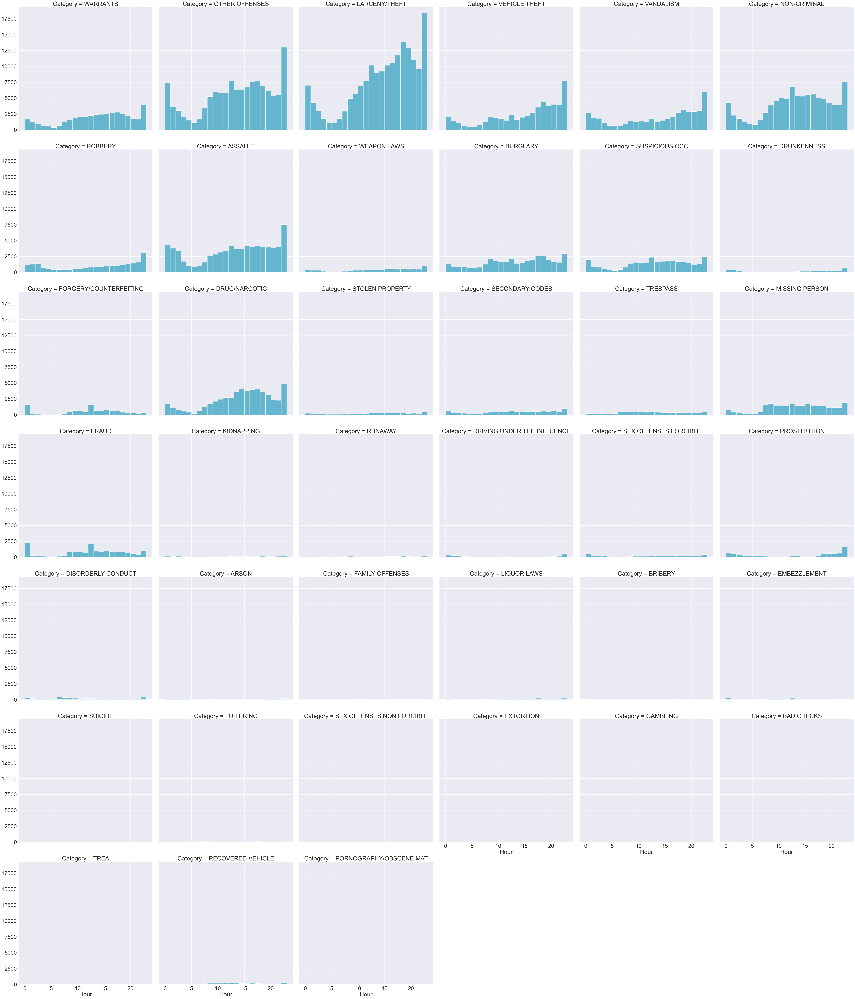

In [121]:
sns.set(font_scale=2.5)
# Create a FacetGrid to visualize histograms
crime_facet_grid = sns.FacetGrid(train, col="Category", col_wrap=6, height=10)

# Map histograms of the "Hour" feature for each crime category
crime_facet_grid = crime_facet_grid.map(plt.hist, "Hour", bins=np.arange(0, 24), color="c")

# Show the plot
plt.show()

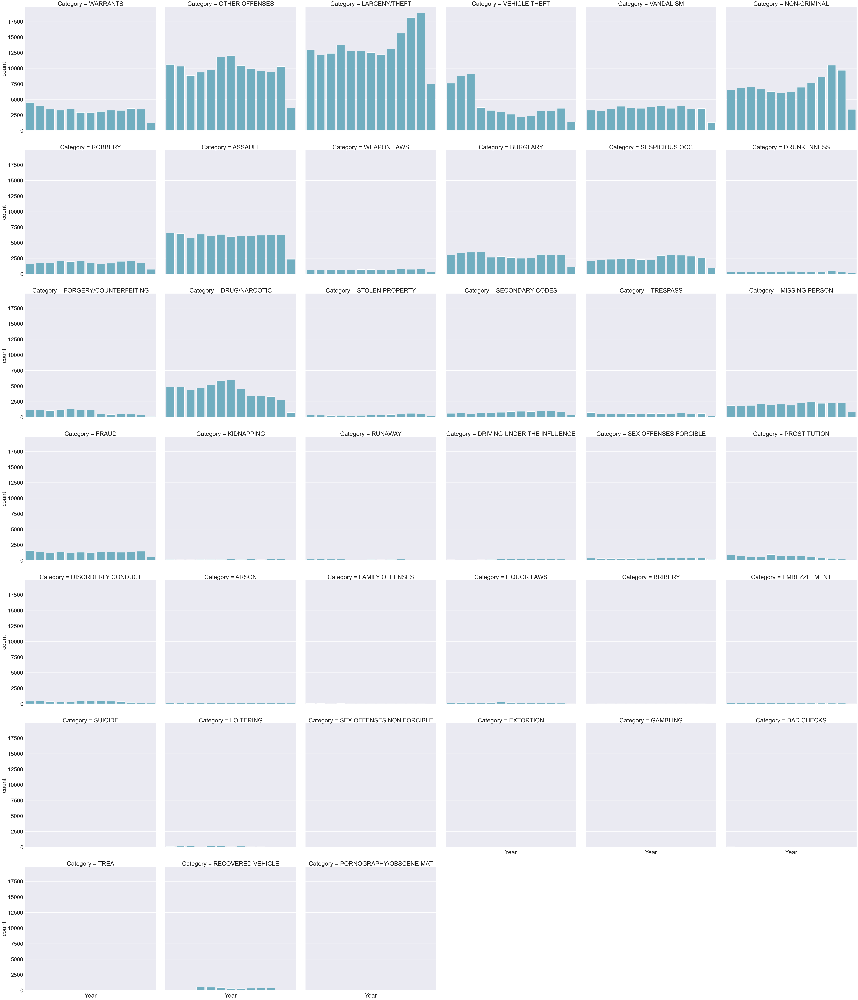

In [129]:
# Create a FacetGrid to visualize count plots
crime_facet_grid = sns.FacetGrid(train, col="Category", col_wrap=6, height=10)

# Map count plots of the "Year" feature for each crime category
crime_facet_grid = crime_facet_grid.map(sns.countplot, "Year", order=sorted(train['Year'].unique()), color="c")

# Rotate x-axis labels for better readability
crime_facet_grid.set_xticklabels(rotation=30)

# Show the plot
plt.show()

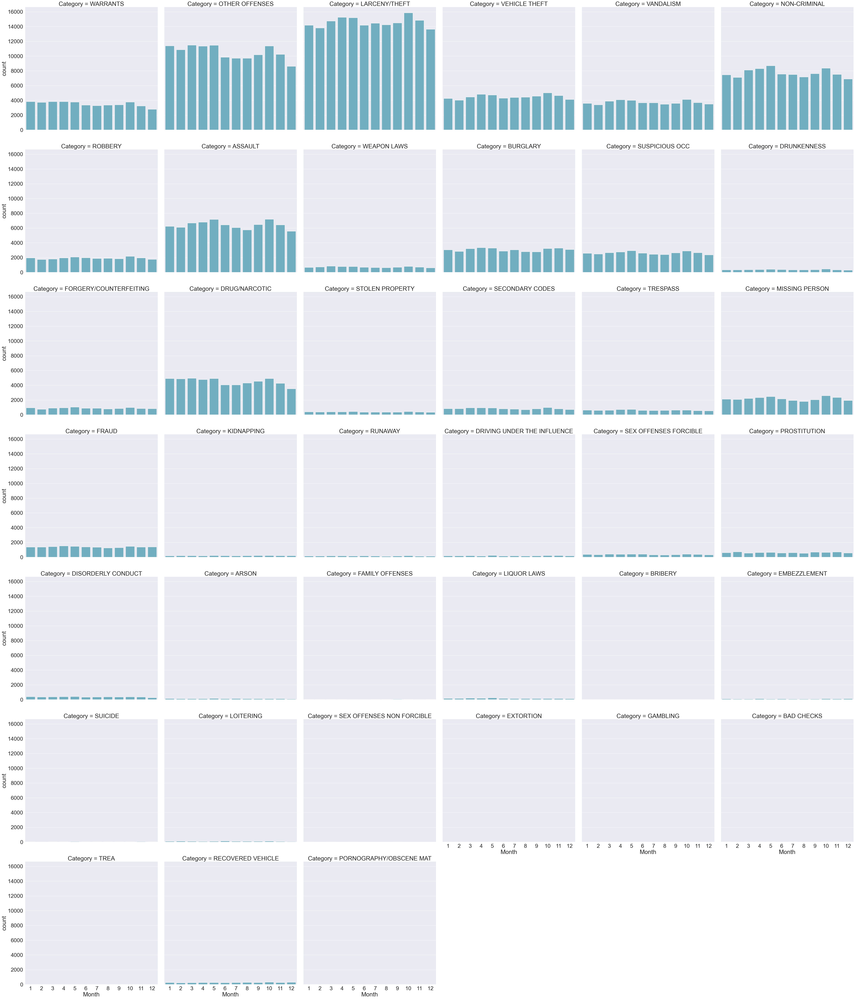

In [130]:
# Create a FacetGrid to visualize count plots
crime_grid = sns.FacetGrid(train, col="Category", col_wrap=6, height=10)

# Map count plots of the "Month" feature for each crime category
crime_grid = crime_grid.map(sns.countplot, "Month", order=sorted(train['Month'].unique()), color="c")

# Show the plot
plt.show()

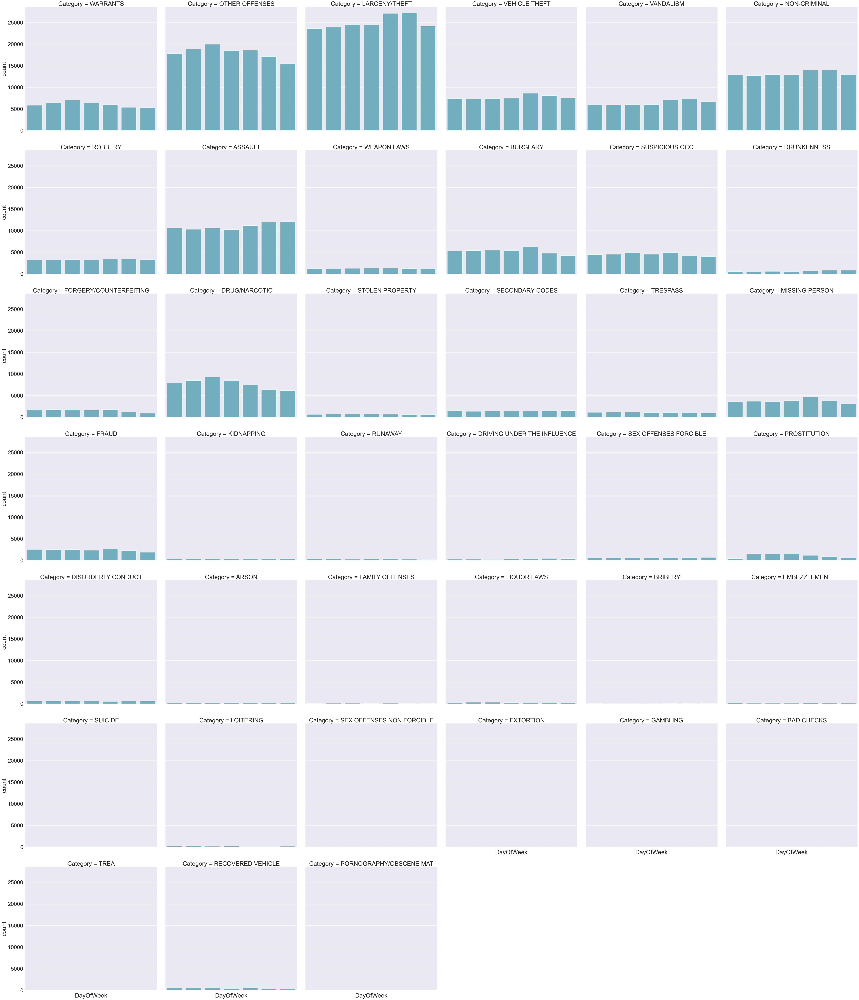

In [131]:
# Create a FacetGrid to visualize count plots
crime_facet_grid = sns.FacetGrid(train, col="Category", col_wrap=6, height=10)

# Map count plots of the "DayOfWeek" feature for each crime category
crime_facet_grid = crime_facet_grid.map(sns.countplot, "DayOfWeek", order=train['DayOfWeek'].sort_values().unique(), color="c")

# Rotate x-axis labels for better readability
crime_facet_grid.set_xticklabels(rotation=30)

# Show the plot
plt.show()

In [125]:
def plot_crime_locations(data_frame, crime_categories):
    fig = plt.figure(figsize=(20, 40))

    for i, crime in enumerate(crime_categories, 1):
        ax = plt.subplot(10, 4, i)
        crime_data = data_frame[data_frame['Category'] == crime]
        ax.scatter(crime_data['X'], crime_data['Y'], alpha=0.01)
        ax.set_title(f"{crime} Locations")
        ax.set_xlabel("Longitude", fontsize=15)
        ax.set_ylabel("Latitude", fontsize=15)

    # Save plot image
    plt.tight_layout()
    fig.savefig('visualizations/sf_crime_locations_per_category_map.png', bbox_inches='tight')

In [126]:
crime_per_PD = train['PdDistrict'].value_counts()
crime_per_PD

PdDistrict
SOUTHERN      157182
MISSION       119908
NORTHERN      105296
BAYVIEW        89431
CENTRAL        85460
TENDERLOIN     81809
INGLESIDE      78845
TARAVAL        65596
PARK           49313
RICHMOND       45209
Name: count, dtype: int64

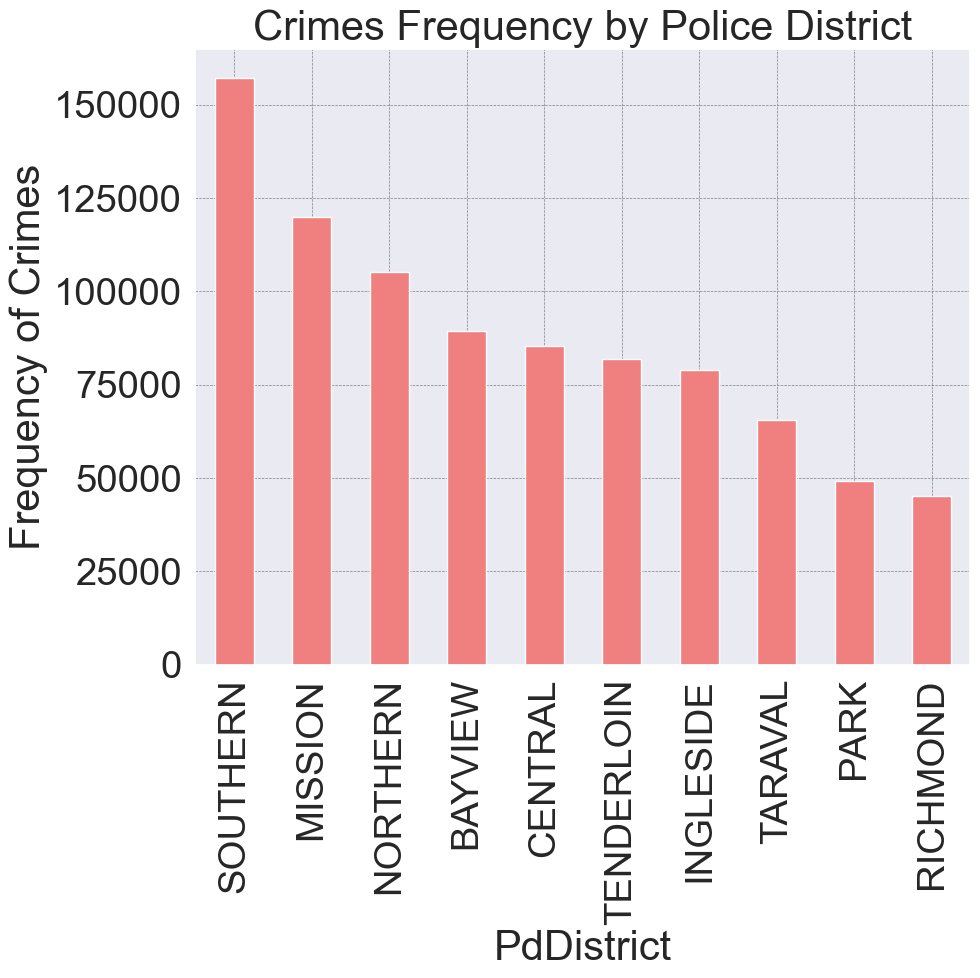

In [127]:
import os
import matplotlib.pyplot as plt

# Create 'visualizations' directory if it doesn't exist
os.makedirs('visualizations', exist_ok=True)

# Create a figure
fig = plt.figure(figsize=(10, 8))

# Set the title and labels for the plot
plt.title("Crimes Frequency by Police District")
plt.xlabel("Police District")
plt.ylabel("Frequency of Crimes")

# Plot the vertical bar chart with gridlines
ax = crime_per_PD.plot(kind='bar', color='lightcoral', grid=True)

# Customize gridlines
ax.grid(color='gray', linestyle='--', linewidth=0.5)

# Save the plot image
fig.savefig('visualizations/Crime_Frequency_Police_District.png', bbox_inches='tight')

# Show the plot
plt.show()

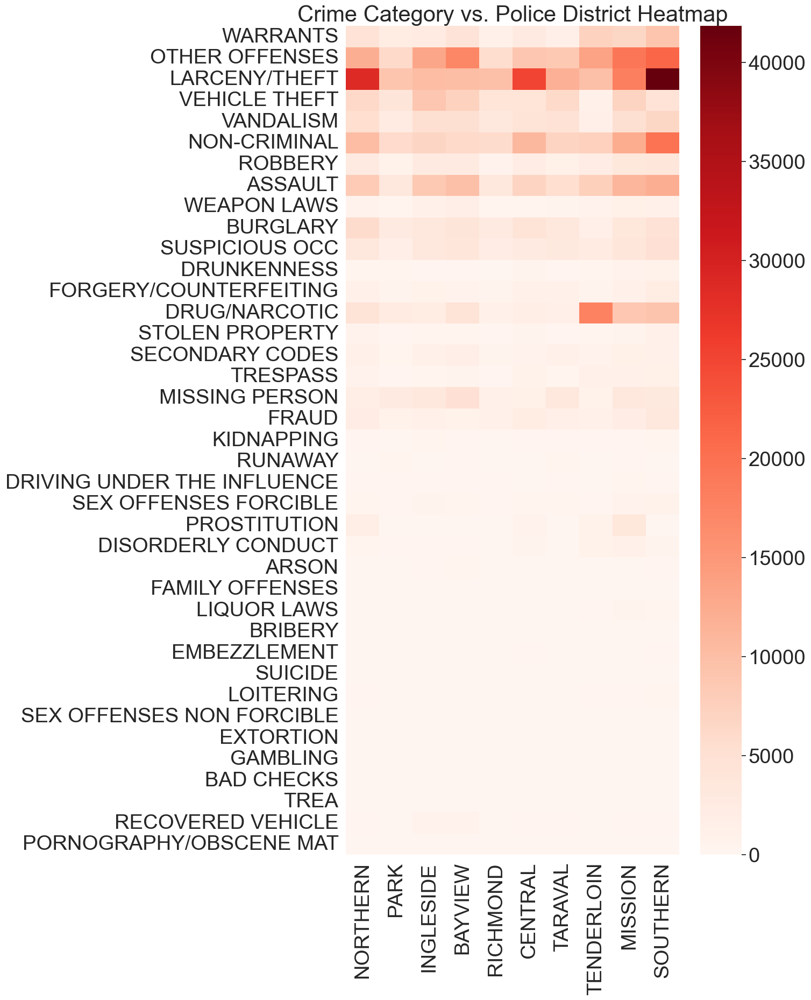

In [128]:
import os
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Create 'visualizations' directory if it doesn't exist
os.makedirs('visualizations', exist_ok=True)

# Get unique crime categories and police districts
crime_categories = train['Category'].unique()
police_districts = train['PdDistrict'].unique()

# Initialize a list to store counts
crime_district_counts = []

# Iterate over crime categories
for category in crime_categories:
    district_counts = []
    # Iterate over police districts
    for district in police_districts:
        # Count occurrences of category in each district
        count = len(train[(train['PdDistrict'] == district) & (train['Category'] == category)])
        district_counts.append(count)
    crime_district_counts.append(district_counts)

# Create a DataFrame for the heatmap
crime_heatmap_df = pd.DataFrame(crime_district_counts, index=crime_categories, columns=police_districts)

# Create a figure and axes
fig, ax = plt.subplots(figsize=(10, 20))

# Plot the heatmap with a different colormap
sns.heatmap(crime_heatmap_df, cmap='Reds', ax=ax)

# Set title and save the plot image
plt.title("Crime Category vs. Police District Heatmap")
fig.savefig('visualizations/Crime_Category_vs_PdDistrict_Heatmap.png', bbox_inches='tight')

# Show the plot
plt.show()

Data Cleaning

In [35]:
train[train['Y'] == train['Y'].max()]

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Hour,Month,Year
660485,2005-12-30 17:00:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Friday,TENDERLOIN,NONE,5THSTNORTH ST / OFARRELL ST,-120.5,90.0,17,12,2005
660711,2005-12-30 00:34:00,ASSAULT,INFLICT INJURY ON COHABITEE,Friday,BAYVIEW,"ARREST, BOOKED",JAMESLICKFREEWAY HY / SILVER AV,-120.5,90.0,0,12,2005
660712,2005-12-30 00:34:00,ASSAULT,AGGRAVATED ASSAULT WITH BODILY FORCE,Friday,BAYVIEW,"ARREST, BOOKED",JAMESLICKFREEWAY HY / SILVER AV,-120.5,90.0,0,12,2005
661106,2005-12-29 00:07:00,NON-CRIMINAL,"AIDED CASE, MENTAL DISTURBED",Thursday,TENDERLOIN,PSYCHOPATHIC CASE,5THSTNORTH ST / EDDY ST,-120.5,90.0,0,12,2005
666430,2005-11-30 11:25:00,OTHER OFFENSES,TRAFFIC VIOLATION,Wednesday,TENDERLOIN,"ARREST, CITED",5THSTNORTH ST / ELLIS ST,-120.5,90.0,11,11,2005
667042,2005-11-28 16:04:00,TRESPASS,TRESPASSING,Monday,TENDERLOIN,"ARREST, BOOKED",ELLIS ST / 5THSTNORTH ST,-120.5,90.0,16,11,2005
669946,2005-11-14 09:20:00,OTHER OFFENSES,"DRIVERS LICENSE, SUSPENDED OR REVOKED",Monday,BAYVIEW,"ARREST, BOOKED",YOSEMITE AV / WILLIAMS AV,-120.5,90.0,9,11,2005
671709,2005-11-02 20:30:00,OTHER OFFENSES,MISCELLANEOUS INVESTIGATION,Wednesday,CENTRAL,NONE,BRENHAM PL / WASHINGTON ST,-120.5,90.0,20,11,2005
673078,2005-10-23 20:00:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Sunday,RICHMOND,NONE,AVENUE OF THE PALMS / GEARY BL,-120.5,90.0,20,10,2005
673114,2005-10-23 18:11:00,WARRANTS,ENROUTE TO OUTSIDE JURISDICTION,Sunday,TARAVAL,"ARREST, BOOKED",STCHARLES AV / 19TH AV,-120.5,90.0,18,10,2005


In [36]:
train['Y'].replace(to_replace=train['Y'].max(), value=np.nan, inplace=True)
train['X'].replace(to_replace=train['X'].max(), value=np.nan, inplace=True)

test['Y'].replace(to_replace=test['Y'].max(), value=np.nan, inplace=True)
test['X'].replace(to_replace=test['X'].max(), value=np.nan, inplace=True)

In [37]:
train.isnull().sum()

Dates          0
Category       0
Descript       0
DayOfWeek      0
PdDistrict     0
Resolution     0
Address        0
X             67
Y             67
Hour           0
Month          0
Year           0
dtype: int64

In [38]:
test.isnull().sum()

Id             0
Dates          0
DayOfWeek      0
PdDistrict     0
Address        0
X             76
Y             76
dtype: int64

In [39]:
data = [train, test]

for dataset in data:
    median_X = dataset["X"].median()
    median_Y = dataset["Y"].median()

    X_slice = dataset['X'].copy()
    Y_slice = dataset['Y'].copy()
    X_slice.fillna(median_X, inplace=True)
    Y_slice.fillna(median_Y, inplace=True)
    dataset['X'] = X_slice
    dataset['Y'] = Y_slice

In [40]:
train[['X', 'Y']].describe()

,X,Y
count,878049.000000,878049.000000
mean,-122.422763,37.767035
std,0.025284,0.024164
min,-122.513642,37.707879
25%,-122.432952,37.752427
50%,-122.416420,37.775421
75%,-122.406959,37.784368
max,-122.364937,37.819975


In [41]:
len(train)

878049

In [42]:
test[['X', 'Y']].describe()

,X,Y
count,884262.000000,884262.000000
mean,-122.422858,37.766987
std,0.025344,0.024178
min,-122.513642,37.707879
25%,-122.433069,37.752374
50%,-122.416517,37.775421
75%,-122.406959,37.784353
max,-122.364751,37.820621


In [43]:
len(test)

884262

Feature Engineering

In [44]:
train["Dates"] = pd.to_datetime(train["Dates"], format="%Y-%m-%d %H:%M:%S")
test["Dates"] = pd.to_datetime(test["Dates"], format="%Y-%m-%d %H:%M:%S")

train["Minute"] = train["Dates"].map(lambda x: x.minute)
test["Minute"] = test["Dates"].map(lambda x: x.minute)

train["Hour"] = train["Dates"].map(lambda x: x.hour)
test["Hour"] = test["Dates"].map(lambda x: x.hour)

train["Day"] = train["Dates"].map(lambda x: x.day)
test["Day"] = test["Dates"].map(lambda x: x.day)

train["Month"] = train["Dates"].map(lambda x: x.month)
test["Month"] = test["Dates"].map(lambda x: x.month)

train["Year"] = train["Dates"].map(lambda x: x.year)
test["Year"] = test["Dates"].map(lambda x: x.year)

In [45]:
def classify_hour_zone(hour):
    if hour >= 2 and hour < 8: 
        return 0  # Late night
    elif hour >= 8 and hour < 12: 
        return 1  # Morning
    elif hour >= 12 and hour < 18: 
        return 2  # Afternoon
    elif hour >= 18 and hour < 22: 
        return 3  # Evening
    else: 
        return 4  # Late night

train["Hour_Zone"] = train["Hour"].map(classify_hour_zone)
test["Hour_Zone"] = test["Hour"].map(classify_hour_zone)

In [46]:
# Add Week of Year
train["WeekOfYear"] = train["Dates"].map(lambda x: int(x.weekofyear / 2) - 1)
test["WeekOfYear"] = test["Dates"].map(lambda x: int(x.weekofyear / 2))

print(sorted(train['WeekOfYear'].unique()))
print(sorted(test['WeekOfYear'].unique()))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26]


In [47]:
from pandas.tseries.holiday import USFederalHolidayCalendar as calendar

# Define the holiday calendar
cal = calendar()

# Extract holidays falling between the start and end dates of the train dataset
holidays_train = cal.holidays(start=train['Dates'].min(), end=train['Dates'].max())

# Create a new column 'Holiday' in the training set to indicate whether each date is a holiday or not
train['Holiday'] = train['Dates'].dt.floor('D').isin(holidays_train)

In [48]:
# Extract holidays falling between the start and end dates of the test dataset
holidays_test = cal.holidays(start=test['Dates'].min(), end=test['Dates'].max())

# Create a new column 'Holiday' in the test set to indicate whether each date is a holiday or not
test['Holiday'] = test['Dates'].dt.floor('D').isin(holidays_test)

In [49]:
len(train[train['Holiday'] == True])

25653

In [50]:
len(test[test['Holiday'] == True])

18316

In [51]:
from datetime import datetime, time

def check_business_hours(start, end, x):
    """Return true if x is in the inclusive range [start, end]"""
    if start <= end:
        return start <= x <= end
    else:
        return start <= x or x <= end

def map_business_hours(date):
    
    # Convert military time to AM & PM
    time_parsed = date.time()
    business_start = time(8, 0, 0)
    business_end = time(18, 0, 0)
    
    if check_business_hours(business_start, business_end, time_parsed):
        return 1
    else:
        return 0
    
train['BusinessHour'] = train['Dates'].map(map_business_hours).astype('uint8')
test['BusinessHour'] = test['Dates'].map(map_business_hours).astype('uint8')

In [52]:
train['BusinessHour'].value_counts()

BusinessHour
1    455215
0    422834
Name: count, dtype: int64

In [53]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Hour,Month,Year,Minute,Day,Hour_Zone,WeekOfYear,Holiday,BusinessHour
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,23,5,2015,53,13,4,9,False,0
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,23,5,2015,53,13,4,9,False,0
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,23,5,2015,33,13,4,9,False,0
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,23,5,2015,30,13,4,9,False,0
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,23,5,2015,30,13,4,9,False,0


In [54]:
train['Season']=(train['Month']%12 + 3)//3
test['Season']=(test['Month']%12 + 3)//3

In [55]:
# Weekday = 0, Weekend = 1
days = {'Monday':0 ,'Tuesday':0 ,'Wednesday':0 ,'Thursday':0 ,'Friday':0, 'Saturday':1 ,'Sunday':1}

train['Weekend'] = train['DayOfWeek'].replace(days).astype('uint8')
test['Weekend'] = test['DayOfWeek'].replace(days).astype('uint8')

In [56]:
train.head()

,Dates,Category,Descript,DayOfWeek,PdDistrict,Resolution,Address,X,Y,Hour,Month,Year,Minute,Day,Hour_Zone,WeekOfYear,Holiday,BusinessHour,Season,Weekend
0,2015-05-13 23:53:00,WARRANTS,WARRANT ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,23,5,2015,53,13,4,9,False,0,2,0
1,2015-05-13 23:53:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",OAK ST / LAGUNA ST,-122.425892,37.774599,23,5,2015,53,13,4,9,False,0,2,0
2,2015-05-13 23:33:00,OTHER OFFENSES,TRAFFIC VIOLATION ARREST,Wednesday,NORTHERN,"ARREST, BOOKED",VANNESS AV / GREENWICH ST,-122.424363,37.800414,23,5,2015,33,13,4,9,False,0,2,0
3,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,NORTHERN,NONE,1500 Block of LOMBARD ST,-122.426995,37.800873,23,5,2015,30,13,4,9,False,0,2,0
4,2015-05-13 23:30:00,LARCENY/THEFT,GRAND THEFT FROM LOCKED AUTO,Wednesday,PARK,NONE,100 Block of BRODERICK ST,-122.438738,37.771541,23,5,2015,30,13,4,9,False,0,2,0


In [57]:
train.isnull().sum()

Dates           0
Category        0
Descript        0
DayOfWeek       0
PdDistrict      0
Resolution      0
Address         0
X               0
Y               0
Hour            0
Month           0
Year            0
Minute          0
Day             0
Hour_Zone       0
WeekOfYear      0
Holiday         0
BusinessHour    0
Season          0
Weekend         0
dtype: int64

In [58]:
train['Address'].value_counts().index

Index(['800 Block of BRYANT ST', '800 Block of MARKET ST',
       '2000 Block of MISSION ST', '1000 Block of POTRERO AV',
       '900 Block of MARKET ST', '0 Block of TURK ST', '0 Block of 6TH ST',
       '300 Block of ELLIS ST', '400 Block of ELLIS ST',
       '16TH ST / MISSION ST',
       ...
       '5TH AV / CALIFORNIA ST', 'HAZELWOOD AV / YERBABUENA AV',
       '0 Block of TROY AL', '900 Block of MARTIN LUTHER KING JR DR',
       'CLIPPER ST / PORTOLA DR', 'PRECITA AV / CESAR CHAVEZ ST',
       '0 Block of COLUSA PL', '2800 Block of KEITH ST',
       'CABRILLO ST / ARGUELLO BL', 'OFARRELL ST / CYRIL MAGNIN ST'],
      dtype='object', name='Address', length=23228)

In [59]:
import re

def identify_street_type(address):
    street_types = ['AV', 'ST', 'CT', 'PZ', 'LN', 'DR', 'PL', 'HY', 
                    'FY', 'WY', 'TR', 'RD', 'BL', 'WAY', 'CR', 'AL', 'I-80',  
                    'RW', 'WK','EL CAMINO DEL MAR']
    pattern = '|'.join(street_types)
    matches = re.findall(pattern, address)
    if len(matches) == 0:
        return 'OTHER'
    elif len(matches) == 1:
        return matches[0]
    else:
        return 'INT'

# Apply the street type identification function to both train and test data
train['StreetType'] = train['Address'].map(identify_street_type)
test['StreetType'] = test['Address'].map(identify_street_type)

In [60]:
train['StreetType'].value_counts()

StreetType
INT                  389995
ST                   358797
AV                    92467
BL                    13074
DR                     8200
WY                     4063
RD                     2384
PZ                     2347
CT                     2059
LN                     1356
PL                      863
HY                      819
TR                      766
I-80                    322
CR                      291
AL                      150
WAY                      55
EL CAMINO DEL MAR        21
OTHER                    14
WK                        5
RW                        1
Name: count, dtype: int64

In [61]:
train['StreetType'].isnull().sum()

0

In [62]:
import re

def extract_block_number(address):
    block_num_pattern = '[0-9]+\s[Block]'
    block_num_match = re.search(block_num_pattern, address)
    if block_num_match:
        num_pattern = '[0-9]+'
        block_no_match = re.search(num_pattern, address)
        block_no = int(block_no_match.group())
        block_map = (block_no // 100) + 1
        return block_map
    else:
        return 0

# Apply the block number extraction function to both train and test data
train['BlockNo'] = train['Address'].map(extract_block_number)
test['BlockNo'] = test['Address'].map(extract_block_number)

In [63]:
train['BlockNo'].value_counts()

BlockNo
0     260818
1      76325
2      51917
9      51718
3      38407
5      36799
4      35866
6      30424
7      23431
8      23176
11     22250
10     18341
13     15165
12     14791
14     13312
15     13153
21     12928
16     12801
17     11824
18     10982
19      9571
24      7482
22      6962
23      6847
20      6478
25      5412
33      5345
26      4573
27      4422
32      3834
29      3807
28      3667
31      3639
34      3541
30      2958
36      2185
35      2104
37      1831
39      1644
40      1637
38      1553
42      1498
41      1369
50       919
48       900
47       835
43       768
46       764
45       756
53       698
44       667
52       597
49       514
51       485
54       447
57       343
56       328
55       320
63       274
58       254
59       210
67       202
64       164
62       149
60       138
65        64
61        62
66        60
71        58
72        41
70        39
69        38
77        26
74        24
68        23
73        19
78  

In [64]:
print('There are %d unique longitude values, %d unique latitude values' % (train['X'].nunique(), 
                                                                           train['Y'].nunique()))

xy_scaler = StandardScaler().fit(train[['X', 'Y']])
train[['X', 'Y']] = xy_scaler.transform(train[['X', 'Y']])
test[['X', 'Y']] = xy_scaler.transform(test[['X', 'Y']])

There are 34242 unique longitude values, 34242 unique latitude values


In [65]:
cos_30 = math.cos(math.radians(30))
sin_30 = math.sin(math.radians(30))
cos_45 = math.cos(math.radians(45))
sin_45 = math.sin(math.radians(45))
cos_60 = math.cos(math.radians(60))
sin_60 = math.sin(math.radians(60))


train["Rot30_X"] = train['X'] * cos_30 - train['Y'] * sin_30 
train["Rot30_Y"] = train['X'] * sin_30 + train['Y'] * cos_30
train["Rot45_X"] = train['X'] * cos_45 - train['Y'] * sin_45  
train["Rot45_Y"] = train['X'] * sin_45 + train['Y'] * cos_45
train["Rot60_X"] = train['X'] * cos_60 - train['Y'] * sin_60  
train["Rot60_Y"] = train['X'] * sin_60 + train['Y'] * cos_60
train["Radius"] = np.sqrt(train['X'] ** 2 + train['Y'] ** 2)
train["Angle"] = np.arctan2(train['X'], train['Y'])

test["Rot30_X"] = test['X'] * cos_30 - test['Y'] * sin_30  
test["Rot30_Y"] = test['X'] * sin_30 + test['Y'] * cos_30
test["Rot45_X"] = test['X'] * cos_45 - test['Y'] * sin_45  
test["Rot45_Y"] = test['X'] * sin_45 + test['Y'] * cos_45
test["Rot60_X"] = test['X'] * cos_60 - test['Y'] * sin_60  
test["Rot60_Y"] = test['X'] * sin_60 + test['Y'] * cos_60
test["Radius"] = np.sqrt(test['X'] ** 2 + test['Y'] ** 2)
test["Angle"] = np.arctan2(test['X'], test['Y'])

In [66]:
train.describe()

,Dates,X,Y,Hour,Month,Year,Minute,Day,Hour_Zone,WeekOfYear,BusinessHour,Season,Weekend,BlockNo,Rot30_X,Rot30_Y,Rot45_X,Rot45_Y,Rot60_X,Rot60_Y,Radius,Angle
count,878049,8.780490e+05,8.780490e+05,878049.000000,878049.000000,878049.000000,878049.000000,878049.000000,878049.000000,878049.000000,878049.000000,878049.000000,878049.000000,878049.000000,8.780490e+05,8.780490e+05,8.780490e+05,8.780490e+05,8.780490e+05,8.780490e+05,878049.000000,878049.000000
mean,2009-03-16 08:25:41.991847168,1.022002e-12,-3.317319e-13,13.412655,6.436509,2008.712046,20.155026,15.570623,2.212740,12.185458,0.518439,2.513081,0.277339,7.743576,1.050938e-12,2.237195e-13,9.572303e-13,4.880917e-13,7.982818e-13,7.192152e-13,1.219285,0.278980
min,2003-01-06 00:01:00,-3.594393e+00,-2.448135e+00,0.000000,1.000000,2003.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-3.349428e+00,-3.369892e+00,-2.884755e+00,-3.641988e+00,-2.450159e+00,-3.665889e+00,0.020147,-3.141431
25%,2006-01-11 03:00:00,-4.029838e-01,-6.045363e-01,9.000000,3.000000,2006.000000,0.000000,8.000000,1.000000,6.000000,0.000000,2.000000,0.000000,0.000000,-4.146624e-01,-5.663405e-01,-4.910895e-01,-5.404183e-01,-5.844665e-01,-4.591009e-01,0.742421,-1.066458
50%,2009-03-07 16:00:00,2.508765e-01,3.470246e-01,14.000000,6.000000,2009.000000,19.000000,16.000000,2.000000,12.000000,1.000000,2.000000,0.000000,4.000000,6.255002e-02,2.144914e-01,-9.704517e-02,2.241047e-01,-2.373048e-01,3.125220e-01,1.003522,0.508921
75%,2012-06-11 10:13:00,6.250691e-01,7.172889e-01,19.000000,9.000000,2012.000000,33.000000,23.000000,3.000000,19.000000,1.000000,4.000000,1.000000,11.000000,4.805022e-01,8.071880e-01,4.086150e-01,7.867649e-01,5.061257e-01,7.511327e-01,1.639513,1.172463
max,2015-05-13 23:53:00,2.287059e+00,2.190889e+00,23.000000,12.000000,2015.000000,59.000000,31.000000,4.000000,25.000000,1.000000,4.000000,1.000000,84.000000,2.596334e+00,2.856237e+00,2.829143e+00,2.905241e+00,2.869152e+00,2.873912e+00,3.686605,3.141261
std,NaN,1.000001e+00,1.000001e+00,6.549573,3.428972,3.631194,18.594915,8.783005,1.214321,7.482940,0.499660,1.113427,0.447685,10.233725,9.308475e-01,1.064671e+00,9.196852e-01,1.074328e+00,9.308475e-01,1.064671e+00,0.716480,1.652396


In [67]:
data = [train, test]
num_clusters = 40
for dataset in data:
    coordinates = dataset.loc[:,['Y','X']]
    kmeans = KMeans(n_clusters=num_clusters, random_state=1).fit(coordinates)
    id_labels=kmeans.labels_
    dataset['Cluster'] = id_labels

C:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
C:\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


In [68]:
# Drop Address feature from both train and test set
train.drop(['Address'], axis=1, inplace=True)
test.drop(['Address'], axis=1, inplace=True)

# We don't need Dates column anymore
train.drop(['Dates'], axis=1, inplace=True)
test.drop(['Dates'], axis=1, inplace=True)

# Drop Resolution column since test set does not have this column
train.drop(['Resolution'], axis=1, inplace=True)

# Drop Descript column since test set does not have this column
train.drop(['Descript'], axis=1, inplace=True)

# Let's quickly view the data
train.head()

,Category,DayOfWeek,PdDistrict,X,Y,Hour,Month,Year,Minute,Day,Hour_Zone,WeekOfYear,Holiday,BusinessHour,Season,Weekend,StreetType,BlockNo,Rot30_X,Rot30_Y,Rot45_X,Rot45_Y,Rot60_X,Rot60_Y,Radius,Angle,Cluster
0,WARRANTS,Wednesday,NORTHERN,-0.123755,0.313002,23,5,2015,53,13,4,9,False,0,2,0,INT,0,-0.263676,0.209190,-0.308834,0.133818,-0.332945,0.049326,0.336579,-0.376519,7
1,OTHER OFFENSES,Wednesday,NORTHERN,-0.123755,0.313002,23,5,2015,53,13,4,9,False,0,2,0,INT,0,-0.263676,0.209190,-0.308834,0.133818,-0.332945,0.049326,0.336579,-0.376519,7
2,OTHER OFFENSES,Wednesday,NORTHERN,-0.063295,1.381366,23,5,2015,33,13,4,9,False,0,2,0,INT,0,-0.745498,1.164650,-1.021529,0.932017,-1.227945,0.635868,1.382815,-0.045789,29
3,LARCENY/THEFT,Wednesday,NORTHERN,-0.167406,1.400333,23,5,2015,30,13,4,9,False,0,2,0,INT,16,-0.845144,1.129020,-1.108559,0.871811,-1.296427,0.555188,1.410303,-0.118983,29
4,LARCENY/THEFT,Wednesday,PARK,-0.631829,0.186473,23,5,2015,30,13,4,9,False,0,2,0,ST,2,-0.640416,-0.154424,-0.578627,-0.314914,-0.477405,-0.453943,0.658771,-1.283811,39


In [69]:
districts_mapping = {'SOUTHERN': 0, 'MISSION': 1, 'NORTHERN': 2, 'CENTRAL': 3, 'BAYVIEW': 4, 'INGLESIDE': 5, 
                    'TENDERLOIN': 6, 'TARAVAL': 7, 'PARK': 8, 'RICHMOND': 9}

train['PdDistrict'] = train['PdDistrict'].replace(districts_mapping)
test['PdDistrict'] = test['PdDistrict'].replace(districts_mapping)

In [70]:
from sklearn.preprocessing import LabelEncoder

data = [train, test]

for dataset in data:
    year_le = LabelEncoder()
    year_le.fit(dataset['Year'].unique())
    print(list(year_le.classes_))

    dataset['Year'] = year_le.transform(dataset['Year'])

[2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015]
[2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015]


In [71]:
dict(zip(year_le.classes_, year_le.transform(year_le.classes_)))

{2003: 0,
 2004: 1,
 2005: 2,
 2006: 3,
 2007: 4,
 2008: 5,
 2009: 6,
 2010: 7,
 2011: 8,
 2012: 9,
 2013: 10,
 2014: 11,
 2015: 12}

In [72]:
from sklearn.preprocessing import LabelEncoder

data = [train, test]

for dataset in data:
    dow_le = LabelEncoder()
    dow_le.fit(dataset['DayOfWeek'].unique())
    print(list(dow_le.classes_))
    dataset['DayOfWeek'] = dow_le.transform(dataset['DayOfWeek'])

['Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday', 'Wednesday']
['Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday', 'Wednesday']


In [73]:
train['DayOfWeek'].unique()

array([6, 5, 1, 3, 2, 0, 4])

In [74]:
dict(zip(dow_le.classes_, dow_le.transform(dow_le.classes_)))

{'Friday': 0,
 'Monday': 1,
 'Saturday': 2,
 'Sunday': 3,
 'Thursday': 4,
 'Tuesday': 5,
 'Wednesday': 6}

In [75]:
from sklearn.preprocessing import LabelEncoder

data = [train, test]

for dataset in data:
    st_le = LabelEncoder()
    st_le.fit(dataset['StreetType'].unique())
    print(list(st_le.classes_))
    dataset['StreetType'] = st_le.transform(dataset['StreetType'])

['AL', 'AV', 'BL', 'CR', 'CT', 'DR', 'EL CAMINO DEL MAR', 'HY', 'I-80', 'INT', 'LN', 'OTHER', 'PL', 'PZ', 'RD', 'RW', 'ST', 'TR', 'WAY', 'WK', 'WY']
['AL', 'AV', 'BL', 'CR', 'CT', 'DR', 'EL CAMINO DEL MAR', 'HY', 'I-80', 'INT', 'LN', 'OTHER', 'PL', 'PZ', 'RD', 'RW', 'ST', 'TR', 'WAY', 'WK', 'WY']


In [76]:
train['StreetType'].unique()

array([ 9, 16,  1, 20,  4,  5, 17,  7, 14, 13,  2, 12, 10, 18,  3,  0, 11,
       19, 15,  6,  8])

In [77]:
train['Holiday'].replace(False, 0, inplace=True)
train['Holiday'].replace(True, 1, inplace=True)
test['Holiday'].replace(False, 0, inplace=True)
test['Holiday'].replace(True, 1, inplace=True)

train['Holiday'] = train['Holiday'].astype('uint8')
test['Holiday'] = test['Holiday'].astype('uint8')

In [78]:
train[train['Holiday'] == 1].head()

,Category,DayOfWeek,PdDistrict,X,Y,Hour,Month,Year,Minute,Day,Hour_Zone,WeekOfYear,Holiday,BusinessHour,Season,Weekend,StreetType,BlockNo,Rot30_X,Rot30_Y,Rot45_X,Rot45_Y,Rot60_X,Rot60_Y,Radius,Angle,Cluster
18357,DRUG/NARCOTIC,1,0,0.765629,0.347025,23,2,12,48,16,4,3,1,0,1,0,16,9,0.489542,0.683347,0.295998,0.786765,0.082282,0.836566,0.840603,1.145240,14
18358,OTHER OFFENSES,1,0,0.765629,0.347025,23,2,12,48,16,4,3,1,0,1,0,16,9,0.489542,0.683347,0.295998,0.786765,0.082282,0.836566,0.840603,1.145240,14
18359,NON-CRIMINAL,1,5,0.436358,-2.364009,23,2,12,30,16,4,3,1,0,1,0,16,3,1.559901,-1.829113,1.980158,-1.363056,2.265471,-0.804108,2.403944,2.959063,2
18360,VANDALISM,1,3,0.281599,1.685464,23,2,12,30,16,4,3,1,0,1,0,16,28,-0.598860,1.600454,-0.992682,1.390924,-1.318855,1.086604,1.708826,0.165546,33
18361,LARCENY/THEFT,1,2,-0.251045,0.118506,23,2,12,30,16,4,3,1,0,1,0,16,1,-0.276665,-0.022893,-0.261312,-0.093719,-0.228152,-0.158158,0.277610,-1.129757,7


In [79]:
test[test['Holiday'] == 1].head()

,Id,DayOfWeek,PdDistrict,X,Y,Minute,Hour,Day,Month,Year,Hour_Zone,WeekOfYear,Holiday,BusinessHour,Season,Weekend,StreetType,BlockNo,Rot30_X,Rot30_Y,Rot45_X,Rot45_Y,Rot60_X,Rot60_Y,Radius,Angle,Cluster
27957,27957,4,3,0.499750,1.575216,55,23,1,1,12,4,0,1,0,1,0,9,0,-0.354812,1.614052,-0.760470,1.467222,-1.114302,1.220404,1.652591,0.307214,15
27958,27958,4,6,0.192168,0.750371,43,23,1,1,12,4,0,1,0,1,0,9,0,-0.208763,0.745924,-0.394709,0.666476,-0.553756,0.541608,0.774587,0.250709,19
27959,27959,4,1,-0.121797,-0.265408,30,23,1,1,12,4,0,1,0,1,0,16,6,0.027225,-0.290749,0.101548,-0.273795,0.168952,-0.238183,0.292020,-2.711358,8
27960,27960,4,7,-2.341573,-1.310248,15,23,1,1,12,4,0,1,0,1,0,9,1,-1.372738,-2.305494,-0.729257,-2.582227,-0.036079,-2.682985,2.683228,-2.080949,28
27961,27961,4,7,-2.341573,-1.310248,15,23,1,1,12,4,0,1,0,1,0,9,1,-1.372738,-2.305494,-0.729257,-2.582227,-0.036079,-2.682985,2.683228,-2.080949,28


In [80]:
data = [train]

for dataset in data:
    cat_le = LabelEncoder()
    cat_le.fit(dataset['Category'].unique())
    print(list(cat_le.classes_))
    dataset['Category'] = cat_le.transform(dataset['Category'])

['ARSON', 'ASSAULT', 'BAD CHECKS', 'BRIBERY', 'BURGLARY', 'DISORDERLY CONDUCT', 'DRIVING UNDER THE INFLUENCE', 'DRUG/NARCOTIC', 'DRUNKENNESS', 'EMBEZZLEMENT', 'EXTORTION', 'FAMILY OFFENSES', 'FORGERY/COUNTERFEITING', 'FRAUD', 'GAMBLING', 'KIDNAPPING', 'LARCENY/THEFT', 'LIQUOR LAWS', 'LOITERING', 'MISSING PERSON', 'NON-CRIMINAL', 'OTHER OFFENSES', 'PORNOGRAPHY/OBSCENE MAT', 'PROSTITUTION', 'RECOVERED VEHICLE', 'ROBBERY', 'RUNAWAY', 'SECONDARY CODES', 'SEX OFFENSES FORCIBLE', 'SEX OFFENSES NON FORCIBLE', 'STOLEN PROPERTY', 'SUICIDE', 'SUSPICIOUS OCC', 'TREA', 'TRESPASS', 'VANDALISM', 'VEHICLE THEFT', 'WARRANTS', 'WEAPON LAWS']


In [81]:
len(train['Category'].unique())

39

In [82]:
dict(zip(cat_le.classes_, cat_le.transform(cat_le.classes_)))

{'ARSON': 0,
 'ASSAULT': 1,
 'BAD CHECKS': 2,
 'BRIBERY': 3,
 'BURGLARY': 4,
 'DISORDERLY CONDUCT': 5,
 'DRIVING UNDER THE INFLUENCE': 6,
 'DRUG/NARCOTIC': 7,
 'DRUNKENNESS': 8,
 'EMBEZZLEMENT': 9,
 'EXTORTION': 10,
 'FAMILY OFFENSES': 11,
 'FORGERY/COUNTERFEITING': 12,
 'FRAUD': 13,
 'GAMBLING': 14,
 'KIDNAPPING': 15,
 'LARCENY/THEFT': 16,
 'LIQUOR LAWS': 17,
 'LOITERING': 18,
 'MISSING PERSON': 19,
 'NON-CRIMINAL': 20,
 'OTHER OFFENSES': 21,
 'PORNOGRAPHY/OBSCENE MAT': 22,
 'PROSTITUTION': 23,
 'RECOVERED VEHICLE': 24,
 'ROBBERY': 25,
 'RUNAWAY': 26,
 'SECONDARY CODES': 27,
 'SEX OFFENSES FORCIBLE': 28,
 'SEX OFFENSES NON FORCIBLE': 29,
 'STOLEN PROPERTY': 30,
 'SUICIDE': 31,
 'SUSPICIOUS OCC': 32,
 'TREA': 33,
 'TRESPASS': 34,
 'VANDALISM': 35,
 'VEHICLE THEFT': 36,
 'WARRANTS': 37,
 'WEAPON LAWS': 38}

In [83]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878049 entries, 0 to 878048
Data columns (total 27 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Category      878049 non-null  int32  
 1   DayOfWeek     878049 non-null  int32  
 2   PdDistrict    878049 non-null  int64  
 3   X             878049 non-null  float64
 4   Y             878049 non-null  float64
 5   Hour          878049 non-null  int64  
 6   Month         878049 non-null  int64  
 7   Year          878049 non-null  int64  
 8   Minute        878049 non-null  int64  
 9   Day           878049 non-null  int64  
 10  Hour_Zone     878049 non-null  int64  
 11  WeekOfYear    878049 non-null  int64  
 12  Holiday       878049 non-null  uint8  
 13  BusinessHour  878049 non-null  uint8  
 14  Season        878049 non-null  int64  
 15  Weekend       878049 non-null  uint8  
 16  StreetType    878049 non-null  int32  
 17  BlockNo       878049 non-null  int64  
 18  Rot3

In [84]:
# Convert all to 32 bit integers so less memory and will train faster (no loss in data since our integers dont reach)
columns_to_convert = ['DayOfWeek', 'PdDistrict', 'Minute', 'Hour', 'Day', 'Month', 'Year', 
                      'Hour_Zone', 'WeekOfYear', 'Season', 'StreetType', 'BlockNo', 'Cluster']
train[columns_to_convert] = train[columns_to_convert].astype('int16')
test[columns_to_convert] = test[columns_to_convert].astype('int16')

train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878049 entries, 0 to 878048
Data columns (total 27 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   Category      878049 non-null  int32  
 1   DayOfWeek     878049 non-null  int16  
 2   PdDistrict    878049 non-null  int16  
 3   X             878049 non-null  float64
 4   Y             878049 non-null  float64
 5   Hour          878049 non-null  int16  
 6   Month         878049 non-null  int16  
 7   Year          878049 non-null  int16  
 8   Minute        878049 non-null  int16  
 9   Day           878049 non-null  int16  
 10  Hour_Zone     878049 non-null  int16  
 11  WeekOfYear    878049 non-null  int16  
 12  Holiday       878049 non-null  uint8  
 13  BusinessHour  878049 non-null  uint8  
 14  Season        878049 non-null  int16  
 15  Weekend       878049 non-null  uint8  
 16  StreetType    878049 non-null  int16  
 17  BlockNo       878049 non-null  int16  
 18  Rot3

In [85]:
# Set training data (drop labels) and training labels
X_train = train.drop("Category", axis=1).copy()
Y_train = train["Category"].copy()

# Set testing data (drop Id)
X_test = test.drop("Id", axis=1).copy()

In [86]:
def one_hot_encode(train_data):
    encoded_train_data = train_data

    encoded_train_data = pd.concat([encoded_train_data, 
                                    pd.get_dummies(pd.Series(encoded_train_data['PdDistrict']), prefix='PdDistrict')], axis=1)
    encoded_train_data = pd.concat([encoded_train_data, 
                                    pd.get_dummies(pd.Series(encoded_train_data['DayOfWeek']), prefix='DayOfWeek')], axis=1)
    encoded_train_data = pd.concat([encoded_train_data, 
                                    pd.get_dummies(pd.Series(encoded_train_data['StreetType']), prefix='StreetType')], axis=1)
    encoded_train_data = pd.concat([encoded_train_data, 
                                    pd.get_dummies(pd.Series(encoded_train_data['Season']), prefix='Season')], axis=1)
    encoded_train_data = pd.concat([encoded_train_data, 
                                    pd.get_dummies(pd.Series(encoded_train_data['Hour_Zone']), prefix='Hour_Zone')], axis=1)
    encoded_train_data = pd.concat([encoded_train_data, 
                                    pd.get_dummies(pd.Series(encoded_train_data['Cluster']), prefix='Cluster')], axis=1)
    encoded_train_data = encoded_train_data.drop(['Cluster','StreetType', 'Season', 'Hour_Zone', 'DayOfWeek', 'PdDistrict'], axis=1)

    return encoded_train_data

In [87]:
X_encoded_train = one_hot_encode(X_train)

In [88]:
mini_encoded_train_data, mini_encoded_dev_data, mini_train_labels, mini_dev_labels = train_test_split(X_encoded_train, 
                                                                                                    Y_train,
                                                                                                    stratify=Y_train,
                                                                                                    test_size=0.5,
                                                                                                    random_state=1)

In [89]:
mini_train_data, mini_dev_data, mini_train_labels, mini_dev_labels = train_test_split(X_train, 
                                                                                      Y_train,
                                                                                      stratify=Y_train,
                                                                                      test_size=0.5,
                                                                                      random_state=1)

In [90]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import log_loss
import numpy as np

knn = KNeighborsClassifier()
knn.fit(mini_train_data, mini_train_labels)
pred_probs = knn.predict_proba(mini_dev_data)

pred_probs_normalized = np.clip(pred_probs, 1e-15, 1 - 1e-15)  # Clip to avoid division by zero
pred_probs_normalized /= pred_probs_normalized.sum(axis=1, keepdims=True)

knn_loss = log_loss(mini_dev_labels, pred_probs_normalized)

print('KNN Validation Log Loss: ', knn_loss)

KNN Validation Log Loss:  17.929257251769414


In [91]:
rf_clf = RandomForestClassifier(n_estimators=500, max_depth=15, max_features='sqrt',
                                       min_samples_leaf=5, min_samples_split=25, 
                                       random_state=1, verbose=1, n_jobs=2)
rf_clf.fit(mini_train_data, mini_train_labels)
rf_pred_probs = rf_clf.predict_proba(mini_dev_data)

rf_pred_probs_normalized = np.clip(rf_pred_probs, 1e-15, 1 - 1e-15)  # Clip to avoid division by zero
rf_pred_probs_normalized /= rf_pred_probs_normalized.sum(axis=1, keepdims=True)

rf_loss = log_loss(mini_dev_labels, rf_pred_probs_normalized)
print('Random Forest Validation Log Loss: ', rf_loss)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  1.2min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:  4.3min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:  9.3min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed: 10.3min finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   10.7s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   38.6s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:  1.4min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:  1.6min finished


Random Forest Validation Log Loss:  2.282795978973617


In [92]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import log_loss
import numpy as np

# Initialize and train Gaussian Naive Bayes classifier
gnb = GaussianNB()
gnb.fit(mini_train_data, mini_train_labels)

# Predict probabilities for the development set
gnb_pred_probs = gnb.predict_proba(mini_dev_data)

# Normalize predicted probabilities using softmax function
gnb_pred_probs_normalized = np.clip(gnb_pred_probs, 1e-15, 1 - 1e-15)  # Clip to avoid division by zero
gnb_pred_probs_normalized /= gnb_pred_probs_normalized.sum(axis=1, keepdims=True)

# Compute log loss
gnb_loss = log_loss(mini_dev_labels, gnb_pred_probs_normalized)

# Print the log loss
print('Gaussian Naive Bayes Validation Log Loss: ', gnb_loss)

Gaussian Naive Bayes Validation Log Loss:  4.019038771311346


In [136]:
import warnings

In [93]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss
import numpy as np

# Initialize Logistic Regression model
lr = LogisticRegression(max_iter=1000, random_state=42)

# Train the model
lr.fit(mini_train_data, mini_train_labels)

# Predict probabilities for the validation set
lr_pred_probs = lr.predict_proba(mini_dev_data)

# Normalize predicted probabilities using softmax function
lr_pred_probs_normalized = np.clip(lr_pred_probs, 1e-15, 1 - 1e-15)  # Clip to avoid division by zero
lr_pred_probs_normalized /= lr_pred_probs_normalized.sum(axis=1, keepdims=True)

# Compute log loss
lr_loss = log_loss(mini_dev_labels, lr_pred_probs_normalized)

# Print the log loss
print('Logistic Regression Validation Log Loss: ', lr_loss)

C:\Python311\Lib\site-packages\sklearn\linear_model\_logistic.py:460: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression Validation Log Loss:  2.549269532150834


In [94]:
models = pd.DataFrame({
    'Model': ['Logistic Regression (l1)', 'Random Forest', 
              'Gaussian Naive Bayes', 'K Neighbors'],
    'Log_Loss': [lr_loss, rf_loss, gnb_loss, knn_loss]})
# print('KNN Validation Log Loss: ', knn_loss)
# print('Logistic Regression Validation Log Loss: ', lr_loss)
# print('Gaussian Naive Bayes Validation Log Loss: ', gnb_loss)
# print('Random Forest Validation Log Loss: ', rf_loss)
print(models.sort_values(by='Log_Loss', ascending=True).reset_index(drop=True))

                      Model   Log_Loss
0             Random Forest   2.282796
1  Logistic Regression (l1)   2.549270
2      Gaussian Naive Bayes   4.019039
3               K Neighbors  17.929257


In [148]:
from sklearn.metrics import f1_score
rf_clf = RandomForestClassifier(n_estimators=500, max_depth=15, max_features='sqrt',
                                 min_samples_leaf=5, min_samples_split=25, 
                                 random_state=1, verbose=1, n_jobs=2)

rf_clf.fit(mini_train_data, mini_train_labels)
mini_dev_pred = rf_clf.predict(mini_dev_data)

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  1.2min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:  5.4min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed: 12.2min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed: 13.6min finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:   11.0s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   46.8s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:  1.7min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:  2.0min finished


In [ ]:
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier

# Create your model
rf_clf = RandomForestClassifier(n_estimators=500, max_depth=15, max_features='sqrt',
                                 min_samples_leaf=5, min_samples_split=25, 
                                 random_state=1, verbose=1, n_jobs=2)

# Perform cross-validation
scores = cross_val_score(rf_clf, X_train, Y_train, cv=5, scoring='accuracy')  # 5-fold cross-validation

# Print the cross-validation scores
print("Cross-Validation Scores:", scores)

# Calculate and print the mean accuracy
print("Mean Accuracy:", scores.mean())

[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  1.5min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:  6.4min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed: 14.7min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed: 16.6min finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    4.1s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:   17.8s
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed:   43.2s
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed:   48.1s finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:  1.6min
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:  6.5min
[Parallel(n_jobs=2)]: Done 446 tasks      | elapsed: 14.0min
[Parallel(n_jobs=2)]: Done 500 out of 500 | elapsed: 15.6min finished
[